# Urban Road Network Analysis

### **An Analysis of Urban Road Network Structures: The Case of Gazi Street in Elazığ**
This study aims to examine the structural dynamics and analytical approaches of urban road network planning through the case of Gazi Street, located in the city center of Elazığ. Rather than focusing on a traffic data-driven optimization approach, the research emphasizes the significance of the physical structure of the road network, its spatial context, and its interaction with environmental components within the holistic planning of urban transportation systems. In this context, the study analyzes the fundamental criteria that should be considered in the formation of a road network and highlights its role in ensuring efficiency, accessibility, and sustainability in urban mobility.

## Installation Of The Required Libraries

In [4]:
pip install numpy matplotlib osmnx networkx plotly folium scipy python-louvain

Note: you may need to restart the kernel to use updated packages.


## Inclusion Of Libraries In The Project

In [5]:
import osmnx as ox
import networkx as nx
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
from community import community_louvain
import folium
from folium.plugins import MarkerCluster
from folium.plugins import Fullscreen
from folium.plugins import MiniMap ,MousePosition
import plotly.graph_objects as go
from scipy.stats import entropy

## Şehir Yol Ağlarının Getirilmesi

In [6]:
# Coordinates of Elazığ (Gazi Street)
gazi_lat, gazi_lon = 38.6754194, 39.2153528

# Creating a road network graph for Gazi Street
G = ox.graph_from_point((gazi_lat, gazi_lon), dist=3000, dist_type='network', network_type="drive", retain_all=False, truncate_by_edge=False)
# osmnx.graph.graph_from_point(center_point, dist, *, dist_type='bbox' or 'network', network_type={"all", "all_public", "bike", "drive", "drive_service", "walk"}, simplify=True, retain_all=False, truncate_by_edge=False, custom_filter=None)

# Get nodes
gazi_nodes = list(G.nodes())

# Get edges
gazi_edges = list(G.edges())

print("Road network for Gazi Street has been created.")
print(f"Total number of nodes: {len(gazi_nodes)}")
print(f"Total number of edges: {len(gazi_edges)}")
print(f"Graph type: {type(G)}")


# print("\n Gazi Street Node Lists:")
# print("gazi_nodes")

# print("\n Gazi Street Edge Lists:")
# print("gazi_edges")


Road network for Gazi Street has been created.
Total number of nodes: 2597
Total number of edges: 7102
Graph type: <class 'networkx.classes.multidigraph.MultiDiGraph'>


- **2597 Nodes:** These are intersections, road points, or connection points within the road network.  
- **7102 Edges:** These are road connections between the nodes. Each edge represents a segment of a road.  
- **MultiDiGraph:** A multi-directed graph structure. There can be multiple roads between the same two nodes, meaning roads can be bidirectional.


## City Road Network Graph Visualization

In [7]:
# Creating the map
m = folium.Map(location=[gazi_lat, gazi_lon], zoom_start=13)

# TileLayer
folium.TileLayer(
    tiles='https://tiles.stadiamaps.com/tiles/alidade_satellite/{z}/{x}/{y}{r}.{ext}',
    attr='Stadia Maps',
    name='Satellite',
    ext='png'
).add_to(m)

# Grouping nodes with MarkerCluster
marker_cluster = MarkerCluster().add_to(m)

# Adding nodes to the map
for node, data in G.nodes(data=True):
    folium.Marker(
        location=[data['y'], data['x']],
        popup=f"Node: {node}",
        icon=folium.Icon(color="blue", icon="flag")
    ).add_to(marker_cluster)

# Extracting road geometries (edges) nx -> geodataframe
edges_gdf = ox.graph_to_gdfs(G, nodes=False, edges=True)

# Adding roads to the map
for _, row in edges_gdf.iterrows():
  
    line = row['geometry']
    
    road_length = row['length']
    
    road_type = row.get('highway', 'Unknown')
    
    if isinstance(road_type, list):
        road_type = ', '.join(road_type)
    
    lat_lon_u = (line.coords[0][1], line.coords[0][0])  # Start point
    lat_lon_v = (line.coords[-1][1], line.coords[-1][0])  # End point
    
    popup_content = f"""
    <strong>Road Information</strong><br>
    <b>Connection Points:</b><br>
    Point ({lat_lon_u}) - Point ({lat_lon_v})<br><br>
    <b>Road Length:</b> {road_length:.2f} m<br>
    <b>Road Type:</b> {road_type.capitalize()}<br>
    """
    
    # Adding road geometry to the map
    folium.PolyLine(
        locations=[(lat, lon) for lon, lat in line.coords],
        color="red", 
        weight=4,     
        opacity=0.7
    ).add_to(m).add_child(folium.Popup(popup_content, max_width=300))

# Adding fullscreen button
folium.plugins.Fullscreen(
    position="topright",
    title="Expand me",
    title_cancel="Click to exit",
    force_separate_button=True,
).add_to(m)

# Adding minimap
folium.plugins.MiniMap(toggle_display=True).add_to(m)

# Showing mouse position
formatter = "function(num) { return num.toFixed(6); }" 
folium.plugins.MousePosition(
    position="topright",
    separator=" | ",
    empty_string="NaN",
    lng_first=True,
    num_digits=6,  # 6-digit precision
    prefix="Coordinates: ",
    lat_formatter=formatter,
    lng_formatter=formatter
).add_to(m)

# Creating right and left layers
layer_right = folium.TileLayer('Stamen Terrain')
layer_left = folium.TileLayer('OpenStreetMap')
sbs = folium.plugins.SideBySideLayers(layer_left=layer_left, layer_right=layer_right)
layer_left.add_to(m)
layer_right.add_to(m)
sbs.add_to(m)

# Finalizing the map
m


## Degree Centrality

### Degree Centrality

Degree centrality is a fundamental and widely used measure in network analysis that quantifies the connectivity of a node by counting the number of direct links it has with other nodes in the network. It serves as a basic indicator of how central or important a node is within the network structure based on its immediate connections.

**Calculation of Degree Centrality:**

- **In Undirected Networks:**  
The degree centrality of a node is calculated as the number of edges connected to that node, normalized by the maximum possible connections (i.e., total number of nodes minus one):

$$
C_D(v) = \frac{\text{Number of connections (degree)}}{\text{Total nodes} - 1}
$$

Where:  
- \( C_D(v) \) is the degree centrality of node \( v \),  
- Number of connections refers to the count of edges linked to node \( v \),  
- Total nodes represents the total number of nodes in the network.

- **In Directed Networks:**  
Degree centrality is typically divided into two distinct measures: in-degree (incoming connections) and out-degree (outgoing connections):

$$
C_D(v)_{\text{in}} = \frac{\text{Number of incoming edges}}{\text{Total nodes} - 1}
$$

$$
C_D(v)_{\text{out}} = \frac{\text{Number of outgoing edges}}{\text{Total nodes} - 1}
$$

**Interpretation:**

- **High Degree Centrality:** Nodes with a high degree centrality have numerous direct connections, making them highly influential or central within the network. Such nodes often act as hubs or critical points of interaction.

- **Low Degree Centrality:** Nodes with few connections are relatively isolated, indicating a limited influence or role within the network’s overall structure.

In the context of urban road networks, degree centrality can help identify key intersections or junctions that serve as major connectors within the transportation system, highlighting their importance for traffic flow and accessibility.


In [8]:
# Calculate degree centrality
degree_centrality = nx.degree_centrality(G)

# print("Degree centrality for each node:")
# for node, centrality in degree_centrality.items():
#     print(f"Node {node}: {centrality}")


In [9]:
# Sort nodes by degree centrality in descending order
sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

# print("Degree centrality for each node (sorted):")
# for node, centrality in sorted_degree_centrality:
#     print(f"Node {node}: {centrality}")


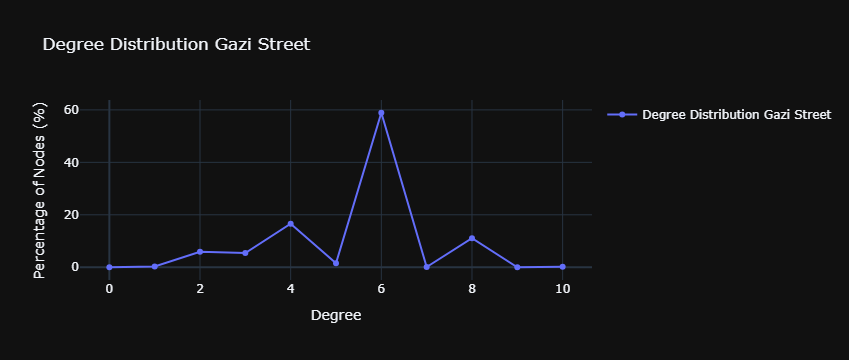

    Degree  Percentage of Nodes
0        0             0.000000
1        1             0.269542
2        2             5.891413
3        3             5.429342
4        4            16.634578
5        5             1.540239
6        6            58.914132
7        7             0.077012
8        8            11.051213
9        9             0.000000
10      10             0.192530


In [26]:
# Calculates the number of nodes for each degree in the network
degree = nx.degree_histogram(G) 

# Calculates the percentage of each degree in the network
perc_degree = [((d * 100) / G.number_of_nodes()) for d in degree] 

# Creates the range of degree values
deg_domain = list(range(0, len(degree)))  

# Creates the Plotly figure
fig = go.Figure()

# Adds data to the figure
fig.add_trace(go.Scatter(
    x=deg_domain, 
    y=perc_degree,
    mode='lines+markers',
    name='Degree Distribution Gazi Street',
    line=dict(width=2),  
    marker=dict(size=6)  
))

# Sets layout options
fig.update_layout(
    title="Degree Distribution Gazi Street",
    xaxis_title="Degree",
    yaxis_title="Percentage of Nodes (%)",
    showlegend=True,
    template="plotly_dark", 
    hovermode='closest'
)

fig.show()

degree_data = {
    "Degree": deg_domain, 
    "Percentage of Nodes": perc_degree
}

df = pd.DataFrame(degree_data)
print(df)


### Degree Centrality Entropy

In general, entropy measures the uncertainty or disorder in a system. In the context of network analysis, entropy helps us understand the diversity and irregularity in the distribution of connections within a network. High entropy typically indicates that the centrality of nodes in the network is distributed irregularly. In this case, some nodes may be more central while others are more isolated. On the other hand, low entropy indicates a more homogeneous degree distribution in the network. In such a network, all nodes may have similar degrees and there is no pronounced centralization. In this type of network, the number of connections of nodes is close to each other, and the network has a more regular structure.

#### Entropy Calculation Formula:

Entropy is calculated using the following formula:

$$
H(X) = - \sum_{i=1}^{n} p_i \log(p_i)
$$

- $H(X)$: Entropy value  
- $p_i$: Probability of each degree (i.e., the proportion of nodes with a specific degree in the network)  
- $n$: Number of nodes or degree types  

According to this formula, the greater the diversity and disorder, the higher the entropy value will be.


In [11]:
total_nodes = G.number_of_nodes()

degree_probabilities = [count / total_nodes for count in degree]


entropy = -np.sum(np.array(degree_probabilities) * np.log2(np.array(degree_probabilities) + 1e-9))

print(f"Derece Dağılımı Entropisi: {entropy}")


Derece Dağılımı Entropisi: 1.8412870424394356


The entropy value I calculated for my network is 1.8412870424394356, which indicates that the degree distribution of my network has high diversity and there is significant irregularity and inequality within the network. High entropy means that the number of connections among nodes varies considerably, implying that my network is irregular. This shows that some nodes have many connections while others have very few. Such a structure indicates the presence of central nodes in the network, but also that many nodes are isolated. Because connection diversity is high, centralization in my network is unevenly distributed and more imbalanced. This suggests that my network has a complex structure with significant inequality among nodes.

# Closeness Centrality

### Closeness Centrality

Closeness centrality is a network metric that represents the inverse of the average shortest path distance from a given node to all other nodes in the network. This measure indicates how quickly and directly a node can access other nodes within the network. In other words, the shorter the paths from a node to all others, the higher its closeness centrality value. This reflects the node's central position in terms of information flow or accessibility.

Closeness centrality is calculated using the formula:

$$
C_C(v) = \frac{n - 1}{\sum_{u \neq v} d(v, u)}
$$

Where:

- \( C_C(v) \) is the closeness centrality of node \( v \),  
- \( d(v, u) \) is the shortest path distance from node \( v \) to node \( u \),  
- \( n \) represents the total number of nodes in the network.

This formula computes the total shortest path distance from a node to all other nodes and takes its inverse. Therefore, nodes with shorter total distances to all others have higher closeness centrality values.


In the context of urban road networks, closeness centrality is a crucial indicator of how accessible a particular intersection or junction is relative to the entire network. Nodes with high closeness centrality can be reached more quickly from other parts of the city, making them vital hubs for efficient traffic flow and connectivity. Identifying such nodes helps urban planners prioritize infrastructure improvements, optimize traffic management, and enhance overall mobility within the city. Ultimately, closeness centrality aids in designing a more connected, accessible, and sustainable urban transportation system.


In [12]:
# Calculate closeness centrality
closeness_centrality = nx.closeness_centrality(G)

# print("Closeness centrality for each node:")
# for node, value in closeness_centrality.items():
#     print(f"Node {node}: {value:.4f}")


In [13]:
sorted_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)

# print("\nNodes Sorted by Closeness Centrality (Descending):")
# for node, value in sorted_closeness:
#     print(f"Node {node}: {value:.4f}")


In [14]:
closeness_values = list(closeness_centrality.values())

closeness_stats = {
    'Min': np.min(closeness_values),
    '1st Quartile': np.percentile(closeness_values, 25),
    'Median': np.median(closeness_values),
    '3rd Quartile': np.percentile(closeness_values, 75),
    'Max': np.max(closeness_values),
    'Mean': np.mean(closeness_values),
}

print("Closeness Centrality Statistics:")
for stat, value in closeness_stats.items():
    print(f"{stat}: {value:.4f}")


Closeness Centrality Statistics:
Min: 0.0218
1st Quartile: 0.0307
Median: 0.0340
3rd Quartile: 0.0373
Max: 0.0447
Mean: 0.0339


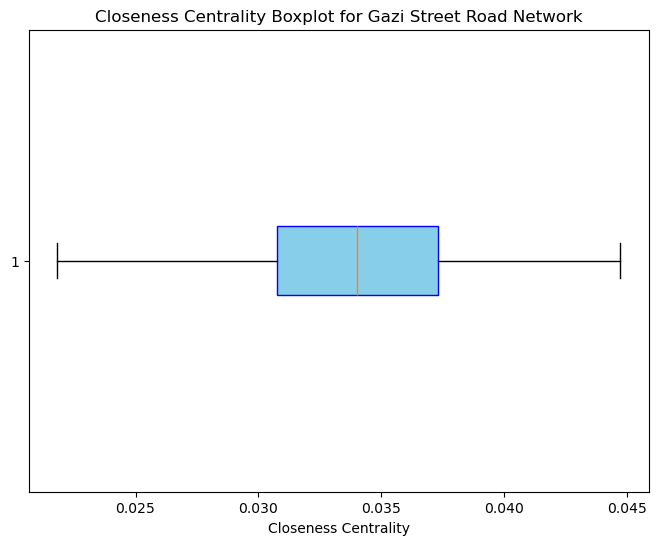

In [15]:
plt.figure(figsize=(8,6))
plt.boxplot(closeness_values, vert=False, patch_artist=True, boxprops=dict(facecolor="skyblue", color="blue"), 
            flierprops=dict(markerfacecolor='red', marker='o', markersize=6, linestyle='none'))
plt.title("Closeness Centrality Boxplot for Gazi Street Road Network")
plt.xlabel("Closeness Centrality")
plt.show()


The lowest closeness centrality value in my network, 0.0218, indicates that some nodes have to travel longer paths to reach other nodes. These nodes might be more isolated or located in more distant parts of the network.

On the other hand, the number of nodes in central positions in my network is also significant. The difference between the first quartile value of 0.0307 and the third quartile value of 0.0373 shows that some nodes are more central than others in my network. This points to the presence of more central nodes within the network.

The median value of 0.0340 reveals that most nodes in my network have an average level of centrality. The mean value of 0.0339 indicates that there isn’t a large variation among nodes and that centrality is generally distributed quite evenly.

The highest closeness centrality value, 0.0447, shows that there is a highly central node in my network that can reach all other nodes in the shortest possible time.

# Community


Community is a measure used to assess the structural integrity of a network and to examine how nodes cluster into communities. In a network, communities are groups of nodes that have many connections within the group, while connections between different communities are relatively sparse. Modularity helps to identify and quantify such structures.

**How is Modularity Calculated?**

Modularity quantifies the strength of division of a network into communities. It is calculated using the formula:

$$
Q = \frac{1}{2m} \sum_{i,j} \left( A_{ij} - \frac{k_i k_j}{2m} \right) \delta(c_i, c_j)
$$

Where:

- \( Q \) represents the modularity value,  
- \( A_{ij} \) indicates the actual connection between nodes \( i \) and \( j \) (i.e., \( A_{ij} = 1 \) if there is an edge between \( i \) and \( j \), otherwise 0),  
- \( k_i \) and \( k_j \) denote the degrees (number of connections) of nodes \( i \) and \( j \) respectively,  
- \( m \) is the total number of edges in the network,  
- \( \delta(c_i, c_j) \) is a function that equals 1 if nodes \( i \) and \( j \) belong to the same community and 0 otherwise.

**High vs. Low Modularity:**

- **High Modularity:** A high modularity value indicates a network with well-defined community structures, where most nodes have strong connections within their own communities and fewer connections between different communities. This suggests a clear division of the network into distinct clusters.  
- **Low Modularity:** A low modularity value suggests a more homogeneous network with less distinct community structures. Nodes tend to be more evenly connected across the network, indicating weaker or less defined community boundaries.

**Importance in Urban Network Analysis**

In urban road networks, modularity analysis helps to identify natural clusters or neighborhoods based on connectivity patterns. High modularity might reveal distinct urban districts or traffic zones with dense internal connectivity and fewer links to other zones. Understanding these community structures aids planners in optimizing traffic management, designing targeted infrastructure improvements, and enhancing localized accessibility. Moreover, modularity can guide sustainable urban development by revealing how different parts of the city are functionally segmented or integrated.


In [16]:
# Convert the directed graph to an undirected graph
G_undirected = G.to_undirected()

# Detect communities using the Louvain method
partition = community_louvain.best_partition(G_undirected)

# Calculate the modularity value
modularity = community_louvain.modularity(partition, G_undirected)

# Print the results
print(f"Modularity for Gazi Street: {modularity}")


Modularity for Gazi Street: 0.9078441051454624


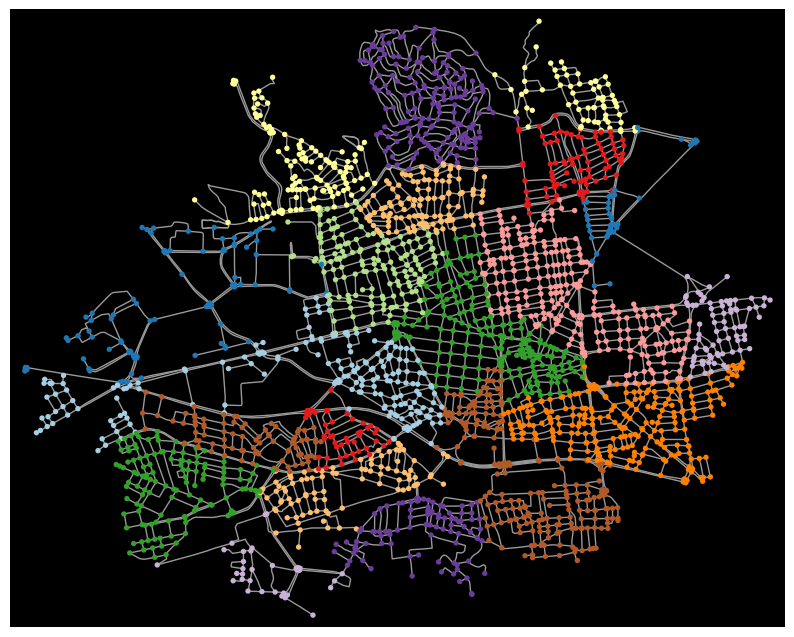

In [17]:
# Assign colors for communities
nx.set_node_attributes(G_undirected, partition, name="attr_city")
nc = ox.plot.get_node_colors_by_attr(G_undirected, attr="attr_city", cmap='Paired')

# Plot the graph
fig, ax = ox.plot_graph(G_undirected, figsize=(10, 10), bgcolor="k", node_color=nc)
plt.pause(0.05)
plt.show()


The modularity value calculated for Gazi Street is 0.9067710965133906, indicating a strong community structure within the network. When the modularity value is close to 1, it shows that the network is well divided into communities, with dense connections within each community and sparse connections between communities. This result emphasizes that Gazi Street has well-defined and distinct communities, and the network's structure is not random.

# Betweenness Centrality

### Betweenness Centrality

Betweenness centrality is a measure that quantifies how often a node appears on the shortest paths between other nodes in the network. A high betweenness centrality value indicates that a node acts as an important intermediary, controlling the flow of information or traffic between other nodes. Such nodes are considered bridge points within the network and play a critical role in communication and information dissemination.

Betweenness centrality is calculated using the formula:

$$
C_B(v) = \sum_{s,t \in V, s \neq t \neq v} \frac{\sigma_{st}(v)}{\sigma_{st}}
$$

Where:

- \( C_B(v) \) represents the betweenness centrality of node \( v \),  
- \( \sigma_{st} \) is the total number of shortest paths between nodes \( s \) and \( t \),  
- \( \sigma_{st}(v) \) is the number of those shortest paths that pass through node \( v \).


In urban road networks, betweenness centrality helps identify critical intersections or junctions that serve as key conduits for traffic flow between different parts of the city. Nodes with high betweenness centrality often act as bottlenecks or vital connectors, and disruptions at these points can significantly impact overall network efficiency. Recognizing these nodes enables urban planners to prioritize interventions such as traffic signal optimization, capacity enhancement, or alternative routing strategies, thereby improving resilience and connectivity within the urban transportation system.


In [18]:
# Betweenness Centrality Calculation
betweenness_centrality = nx.betweenness_centrality(G)

# Get betweenness centrality values
betweenness_values = list(betweenness_centrality.values())

# Statistical summary
betweenness_stats = {
    'Min': np.min(betweenness_values),
    '1st Quartile': np.percentile(betweenness_values, 25),
    'Median': np.median(betweenness_values),
    '3rd Quartile': np.percentile(betweenness_values, 75),
    'Max': np.max(betweenness_values),
    'Mean': np.mean(betweenness_values),
}

# Print summary statistics
print("Betweenness Centrality Statistics:")
for stat, value in betweenness_stats.items():
    print(f"{stat}: {value:.4f}")


Betweenness Centrality Statistics:
Min: 0.0000
1st Quartile: 0.0012
Median: 0.0036
3rd Quartile: 0.0114
Max: 0.1413
Mean: 0.0109


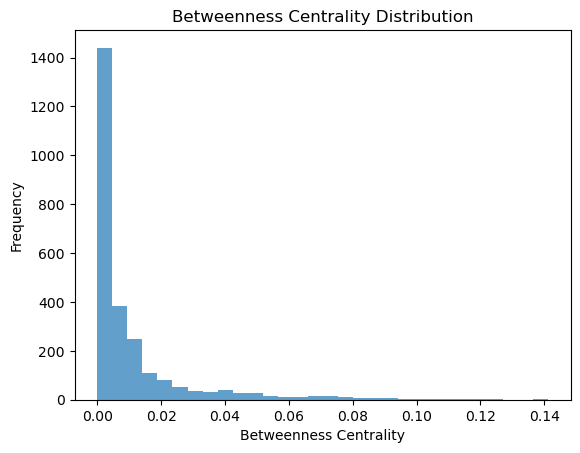

In [19]:
# Plotting the distribution of betweenness centrality values
plt.hist(betweenness_values, bins=30, alpha=0.7)
plt.title('Betweenness Centrality Distribution')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Frequency')
plt.show()


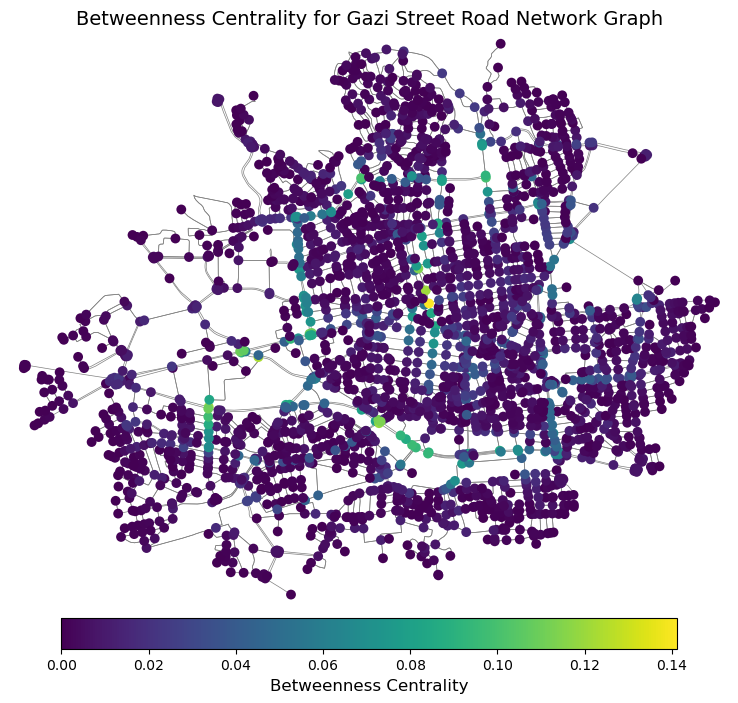

In [20]:
# Determine node colors based on betweenness centrality values
node_colors = [betweenness_centrality[node] for node in G.nodes()]

# Set figure size
fig, ax = plt.subplots(figsize=(10, 8))  # Manually create ax

# Normalize values and choose a color palette (cmap)
norm = mpl.colors.Normalize(vmin=min(betweenness_values), vmax=max(betweenness_values))
cmap = mpl.cm.viridis  # A color palette with green tones is selected

# Plot the network graph
ox.plot_graph(G, node_color=node_colors, node_size=50, edge_color="gray", edge_linewidth=0.5, ax=ax, show=False)

# Add color bar
sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation="horizontal", fraction=0.05, pad=0.02)
cbar.set_label("Betweenness Centrality", fontsize=12)

# Add title
plt.title("Betweenness Centrality for Gazi Street Road Network Graph", fontsize=14)

# Show the plot
plt.show()


# According to Betweenness Centrality Statistics:

- **Minimum (0.0000):** Some nodes do not act as intermediaries in the network, meaning these nodes do not play a significant role in the flow of information.

- **1st Quartile (0.0012) and Median (0.0036):** Most nodes have low betweenness centrality values, indicating that they do not direct information flow within the network.

- **3rd Quartile (0.0114):** Some nodes have higher betweenness centrality values and act as important bridges between different parts of the network.

- **Maximum (0.1413):** The highest value indicates the presence of a highly central node in the network that intermediates communication between many other nodes.

- **Mean (0.0109):** Overall, most nodes in the network have low betweenness centrality values, meaning only a few nodes provide important connections, while most do not play this role.


##  PageRank Centrality

### PageRank

PageRank assigns a score to each node based on both the number and quality of the incoming connections. The fundamental idea is that a node linked to by many important nodes is itself considered important.

The PageRank of a node \( v \) can be calculated using the formula:

$$
PR(v) = \frac{1 - d}{N} + d \sum_{u \in \text{In}(v)} \frac{PR(u)}{L(u)}
$$

Where:

- \( PR(v) \) is the PageRank value of node \( v \),  
- \( d \) is the damping factor (commonly set to 0.85),  
- \( N \) is the total number of nodes in the network,  
- \( \text{In}(v) \) represents the set of nodes that link to node \( v \),  
- \( L(u) \) is the number of outgoing links from node \( u \).

This formula represents the iterative calculation of PageRank, where the importance of each node depends on the importance of the nodes linking to it.


In urban road networks, PageRank can be used to identify critical intersections or segments that receive traffic from highly connected or influential parts of the network. Nodes with high PageRank values are typically significant hubs that influence traffic distribution and overall network efficiency. This metric helps urban planners recognize key points for traffic management, prioritize maintenance, and design improvements to support resilient and efficient transportation systems.


In [21]:
# Calculate PageRank centrality
pagerank_centrality = nx.pagerank(G, alpha=0.85)

print(len(G))

# Display PageRank values
# for node, pr in pagerank_centrality.items():
#     print(f"Node {node}: PageRank = {pr:.4f}")


2597


In [22]:
# Get the top 5 nodes with the highest PageRank values
top_5_pagerank = sorted(pagerank_centrality.items(), key=lambda x: x[1], reverse=True)[:5]

print("\nTop 5 Nodes with the Highest PageRank Values:")
for node, pr in top_5_pagerank:
    print(f"Node {node}: PageRank = {pr:.4f}")



Top 5 Nodes with the Highest PageRank Values:
Node 2204307492: PageRank = 0.0008
Node 2204487567: PageRank = 0.0007
Node 2204400289: PageRank = 0.0007
Node 2203337530: PageRank = 0.0007
Node 2204369194: PageRank = 0.0007


In [23]:
node_id = 2204307492

pagerank_value = pagerank_centrality[node_id]

neighbors = list(G.neighbors(node_id))

degree = G.degree(node_id)

print(f"Node {node_id} Information:")
print(f"PageRank Value: {pagerank_value:.4f}")
print(f"Neighbors: {neighbors}")
print(f"Degree: {degree}")


Node 2204307492 Information:
PageRank Value: 0.0008
Neighbors: [2204307491, 6583702245, 2204307488]
Degree: 5


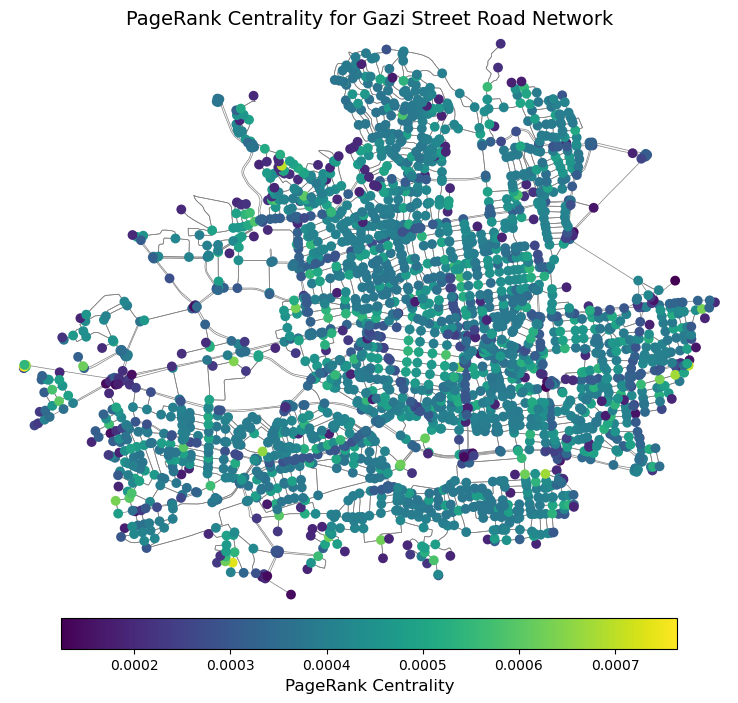

In [25]:
# Set node colors based on PageRank centrality values
node_colors = [pagerank_centrality[node] for node in G.nodes()]

fig, ax = plt.subplots(figsize=(10, 8))

# Normalize values and choose a colormap
norm = mpl.colors.Normalize(vmin=min(pagerank_centrality.values()), vmax=max(pagerank_centrality.values()))
cmap = mpl.cm.viridis

# Plot the network graph
ox.plot_graph(G, node_color=node_colors, node_size=50, edge_color="gray", edge_linewidth=0.5, ax=ax, show=False)

# Add colorbar
sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation="horizontal", fraction=0.05, pad=0.02)
cbar.set_label("PageRank Centrality", fontsize=12)

# Add title
plt.title("PageRank Centrality for Gazi Street Road Network", fontsize=14)

# Show plot
plt.show()


PageRank centrality appears to be concentrated on the peripheral nodes of the graph, which is generally unexpected. Normally, the most critical connection points are expected to be at the center, but here some peripheral nodes have disproportionately high values. This situation suggests there might be missing connections, routing errors, or irregular distribution of weights in the PageRank calculation. To improve the accuracy of the analysis, it would be beneficial to compare with other centrality measures and validate the network structure.

---